In [ ]:
import sys
IN_COLAB = 'google.colab' in sys.modules

!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [ ]:
# Check if the GPU is running
!nvidia-smi 

Tue Nov 30 17:49:26 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P8    34W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from matplotlib import pyplot as plt

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.10")   

1.10.0+cu111 True


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import random
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader


In [ ]:
# Manually load output_dataset folder if in colab

In [ ]:
!unzip output_dataset.zip 

Archive:  output_dataset.zip
   creating: output_dataset/
   creating: output_dataset/test/
  inflating: output_dataset/test/image.000005.iseg.png  
  inflating: output_dataset/test/image.000004.iseg.png  
  inflating: output_dataset/test/image.000004.rgb.png  
  inflating: output_dataset/test/_annotations.coco.json  
   creating: output_dataset/test/.zumometa/
  inflating: output_dataset/test/.zumometa/_plot.image_grid_plot.png  
  inflating: output_dataset/test/.zumometa/_viz.datasheet.txt  
  inflating: output_dataset/test/.zumometa/_plot.pixel_histograms.png  
  inflating: output_dataset/test/.zumometa/_plot.image.000002.rgb.annotated.png  
  inflating: output_dataset/test/.zumometa/_plot.color_correlations_plot.png  
  inflating: output_dataset/test/.zumometa/_plot.image.000003.rgb.annotated.png  
  inflating: output_dataset/test/.zumometa/_plot.category_histograms.png  
  inflating: output_dataset/test/.zumometa/_plot.image.000000.rgb.annotated.png  
  inflating: output_dataset/t

In [ ]:
!ls

__MACOSX  output_dataset      predictions.json	target_images
output	  output_dataset.zip  sample_data	target_images.zip


In [ ]:
class DrinkDetector:
    ''' '''

    def __init__(self, dataset_name="drinks_dataset", dataset_path="output_dataset/",annotations_filename="_annotations.coco.json"):
      
      # Register the dataset in coco format
      register_coco_instances(dataset_name + "_train",{},dataset_path + "train/" + annotations_filename, dataset_path + "train/")
      register_coco_instances(dataset_name + "_test",{},dataset_path +"test/" + annotations_filename, dataset_path + "test/")

      self.dataset_name = dataset_name
      self.dataset_path = dataset_path
      self.annotations_filename = annotations_filename
      self.model_output_name = "model_final.pth"
      self.dataset_dicts_train = DatasetCatalog.get(self.dataset_name + "_train")
      self.dataset_dicts_test = DatasetCatalog.get(self.dataset_name + "_test")
      self.metadata = MetadataCatalog.get(self.dataset_name + "_train")
      self.resume_training = False

      self.init_config()

    def init_config(self):

      self.cfg = get_cfg()
      self.cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
      self.cfg.DATASETS.TRAIN = ("drinks_dataset_train",)
      self.cfg.DATASETS.TEST = ()
      self.cfg.DATALOADER.NUM_WORKERS = 2
      if self.resume_training:
        self.cfg.MODEL.WEIGHTS = "output/" + self.model_output_name
      else:
        self.cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

      self.cfg.SOLVER.IMS_PER_BATCH = 2
      self.cfg.SOLVER.BASE_LR = 0.0005
      self.cfg.SOLVER.MAX_ITER = 500
      self.cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 # Number of different labels in the dataset
      self.cfg.SOLVER.CHECKPOINT_PERIOD = 500  # Save

      os.makedirs(self.cfg.OUTPUT_DIR, exist_ok=True)


    def visualize_dataset(self, dataset_dicts, n=10):

      for d in random.sample(dataset_dicts, n):
          print(d)
          img = cv2.imread(d["file_name"])
          v = Visualizer(img[:, :, ::-1], metadata=self.metadata, scale=0.5)
          v = v.draw_dataset_dict(d)
          plt.figure(figsize = (10, 10))
          plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
          plt.show()

    def draw_prediction(self, im):
      outputs = self.predict(im)
      v = Visualizer(im[:, :, ::-1],
                    metadata=self.metadata, 
                    scale=0.8, 
                    instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
      )
      v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
      plt.figure(figsize = (14, 10))
      plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
      plt.show()

    def visualize_predictions(self, n=10, mode="train"):

      if mode == "train":
        dat_dict = self.dataset_dicts_train
      if mode == "test":
        dat_dict = self.dataset_dicts_test

      for d in random.sample(dat_dict, n):    
          im = cv2.imread(d["file_name"])
          self.draw_prediction(im)

    def save_predictions(self, test_path="./target_images/", visualize=True):

      for image in os.listdir(test_path):    
          im = cv2.imread(test_path +  image)
          outputs = self.predict(im) 
          with open('predictions.txt', 'a') as f:
            f.write("\n" + test_path +  image + str(outputs) + "\n")
          if visualize:
            print(outputs)
            self.draw_prediction(im)

    def train(self, training_steps=100):
      self.cfg.SOLVER.MAX_ITER = training_steps

      self.trainer = DefaultTrainer(self.cfg) 
      if self.resume_training:
        self.trainer.resume_or_load(resume=True) 
      else:
        self.trainer.resume_or_load(resume=False) 
      self.force_training = True 

      if not os.path.isfile(os.path.join(self.cfg.OUTPUT_DIR, self.model_output_name)) or self.force_training:
        self.trainer.train()

    def evaluate(self):
      evaluator = COCOEvaluator(self.dataset_name + "_test", self.cfg, False, output_dir="./output/")
      val_loader = build_detection_test_loader(self.cfg, self.dataset_name +"_test")
      print(inference_on_dataset(self.trainer.model, val_loader, evaluator))

    def predictor_config(self):
      self.cfg.MODEL.WEIGHTS = os.path.join(self.cfg.OUTPUT_DIR, self.model_output_name)
      self.cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
      self.cfg.DATASETS.TEST = ( self.dataset_name + "_test", )
      self.predictor = DefaultPredictor(self.cfg)


    def predict(self, image):
      return self.predictor(image)
      




In [ ]:
drinkD = DrinkDetector()

WARNING [11/30 17:49:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/30 17:49:45 d2.data.datasets.coco]: Loaded 80 images in COCO format from output_dataset/train/_annotations.coco.json
WARNING [11/30 17:49:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/30 17:49:45 d2.data.datasets.coco]: Loaded 10 images in COCO format from output_dataset/test/_annotations.coco.json


{'file_name': 'output_dataset/train/image.000041.rgb.png', 'height': 480, 'width': 640, 'image_id': 82, 'annotations': [{'iscrowd': False, 'bbox': [441.01, 198.01, 60.98000000000002, 176.98000000000002], 'category_id': 1, 'segmentation': [[480.0, 374.99, 455.0, 372.99, 445.0, 369.99, 441.01, 366.0, 441.01, 349.0, 444.01, 327.0, 443.01, 319.0, 445.01, 316.0, 444.01, 306.0, 448.01, 291.0, 447.01, 271.0, 450.01, 239.0, 459.01, 223.0, 469.01, 212.0, 470.01, 200.0, 472.0, 198.01, 487.0, 199.01, 488.99, 201.0, 487.99, 214.0, 494.99, 224.0, 501.99, 241.0, 500.99, 267.0, 498.99, 273.0, 499.99, 277.0, 498.99, 285.0, 495.99, 291.0, 496.99, 313.0, 494.99, 316.0, 495.99, 324.0, 493.99, 327.0, 494.99, 335.0, 492.99, 341.0, 493.99, 346.0, 491.99, 366.0, 488.0, 372.99, 480.0, 374.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


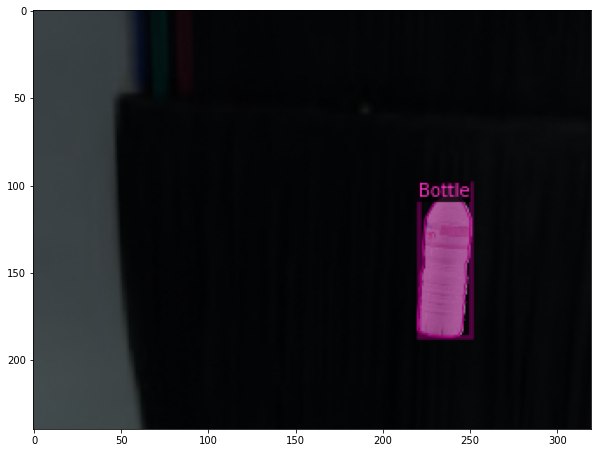

{'file_name': 'output_dataset/train/image.000073.rgb.png', 'height': 480, 'width': 640, 'image_id': 146, 'annotations': [{'iscrowd': False, 'bbox': [280.01, 155.01, 89.98000000000002, 238.98000000000002], 'category_id': 1, 'segmentation': [[323.0, 393.99, 310.0, 393.99, 299.0, 390.99, 290.0, 385.99, 282.01, 376.0, 280.01, 366.0, 280.01, 354.0, 283.01, 341.0, 283.01, 327.0, 287.01, 321.0, 296.01, 265.0, 295.01, 255.0, 302.01, 229.0, 309.01, 214.0, 318.01, 200.0, 335.01, 180.0, 333.01, 176.0, 333.01, 171.0, 335.01, 168.0, 337.01, 157.0, 339.0, 155.01, 350.0, 155.01, 357.0, 157.01, 361.99, 161.0, 359.99, 179.0, 355.99, 182.0, 355.99, 186.0, 365.99, 211.0, 368.99, 226.0, 369.99, 244.0, 367.99, 266.0, 363.99, 274.0, 352.99, 332.0, 353.99, 342.0, 349.99, 351.0, 347.99, 366.0, 344.99, 375.0, 339.99, 384.0, 334.0, 389.99, 323.0, 393.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


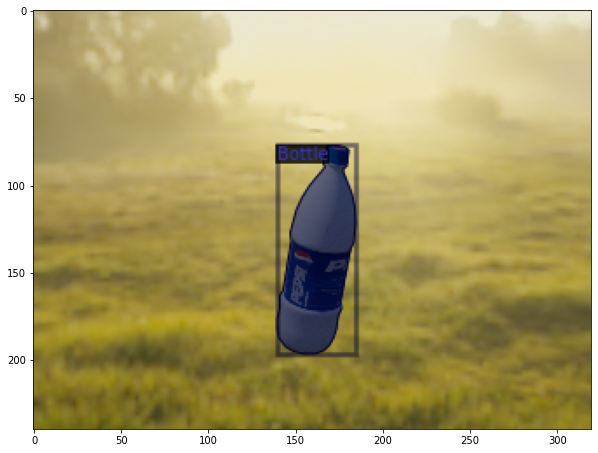

{'file_name': 'output_dataset/train/image.000037.rgb.png', 'height': 480, 'width': 640, 'image_id': 74, 'annotations': [{'iscrowd': False, 'bbox': [410.01, 207.01, 65.98000000000002, 88.98000000000002], 'category_id': 0, 'segmentation': [[449.0, 295.99, 437.0, 293.99, 433.01, 290.0, 410.01, 235.0, 410.01, 220.0, 421.0, 212.01, 435.0, 207.01, 444.0, 207.01, 452.99, 216.0, 475.99, 273.0, 474.99, 280.0, 467.0, 288.99, 460.0, 292.99, 449.0, 295.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


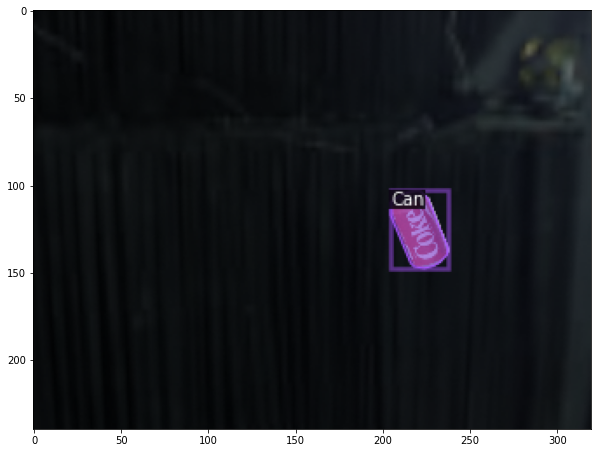

{'file_name': 'output_dataset/train/image.000057.rgb.png', 'height': 480, 'width': 640, 'image_id': 114, 'annotations': [{'iscrowd': False, 'bbox': [404.01, 181.01, 109.98000000000002, 233.98000000000002], 'category_id': 1, 'segmentation': [[460.0, 414.99, 442.0, 413.99, 418.0, 405.99, 405.01, 396.0, 404.01, 388.0, 409.01, 366.0, 414.01, 356.0, 415.01, 343.0, 437.01, 260.0, 442.01, 250.0, 442.01, 242.0, 445.01, 227.0, 450.0, 221.01, 471.0, 211.01, 474.01, 208.0, 475.01, 205.0, 471.01, 199.0, 474.01, 194.0, 477.01, 183.0, 481.0, 181.01, 502.0, 186.01, 506.99, 189.0, 504.99, 207.0, 497.99, 212.0, 497.99, 216.0, 511.99, 236.0, 513.99, 244.0, 507.99, 262.0, 505.99, 264.0, 505.99, 271.0, 482.99, 360.0, 476.99, 372.0, 477.99, 378.0, 473.99, 394.0, 471.99, 397.0, 471.99, 401.0, 468.99, 409.0, 465.0, 412.99, 460.0, 414.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


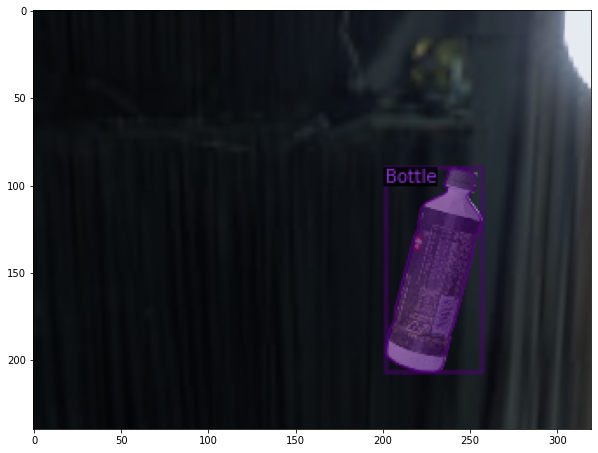

{'file_name': 'output_dataset/train/image.000012.rgb.png', 'height': 480, 'width': 640, 'image_id': 24, 'annotations': [{'iscrowd': False, 'bbox': [415.01, 206.01, 66.98000000000002, 89.98000000000002], 'category_id': 0, 'segmentation': [[456.0, 295.99, 442.0, 293.99, 439.01, 291.0, 415.01, 234.0, 415.01, 220.0, 422.0, 214.01, 442.0, 206.01, 449.0, 206.01, 458.99, 217.0, 481.99, 274.0, 479.99, 281.0, 473.0, 288.99, 466.0, 292.99, 456.0, 295.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


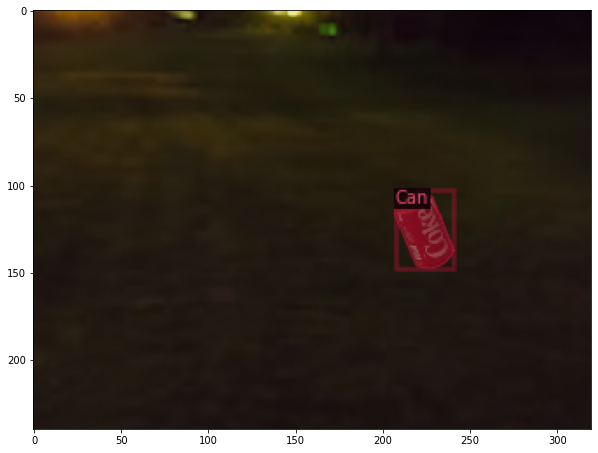

{'file_name': 'output_dataset/train/image.000063.rgb.png', 'height': 480, 'width': 640, 'image_id': 126, 'annotations': [{'iscrowd': False, 'bbox': [445.01, 204.01, 84.98000000000002, 174.98000000000002], 'category_id': 1, 'segmentation': [[487.0, 378.99, 470.0, 376.99, 451.0, 368.99, 445.01, 363.0, 445.01, 356.0, 451.01, 340.0, 450.01, 338.0, 453.01, 332.0, 453.01, 327.0, 456.01, 322.0, 456.01, 317.0, 460.01, 309.0, 460.01, 303.0, 465.01, 295.0, 468.01, 276.0, 471.01, 270.0, 472.01, 262.0, 479.01, 240.0, 490.0, 227.01, 504.01, 217.0, 506.01, 208.0, 510.0, 204.01, 521.0, 207.01, 524.99, 210.0, 521.99, 224.0, 527.99, 237.0, 529.99, 256.0, 518.99, 293.0, 511.99, 307.0, 511.99, 316.0, 507.99, 324.0, 506.99, 332.0, 500.99, 347.0, 500.99, 352.0, 497.99, 357.0, 494.99, 371.0, 491.0, 376.99, 487.0, 378.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


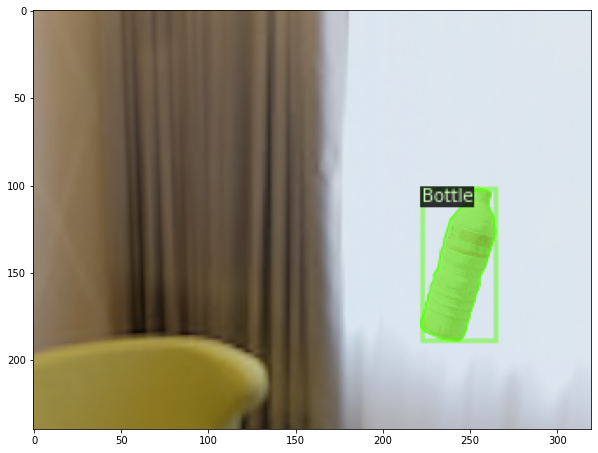

{'file_name': 'output_dataset/train/image.000013.rgb.png', 'height': 480, 'width': 640, 'image_id': 26, 'annotations': [{'iscrowd': False, 'bbox': [88.01, 212.01, 77.98, 169.98000000000002], 'category_id': 0, 'segmentation': [[134.0, 381.99, 120.0, 379.99, 110.0, 373.99, 104.01, 367.0, 88.01, 245.0, 88.01, 241.0, 92.01, 233.0, 91.01, 227.0, 93.01, 223.0, 105.0, 215.01, 117.0, 212.01, 134.0, 212.01, 145.0, 216.01, 149.99, 221.0, 149.99, 226.0, 155.99, 235.0, 156.99, 241.0, 165.99, 360.0, 161.99, 367.0, 154.0, 374.99, 147.0, 378.99, 134.0, 381.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


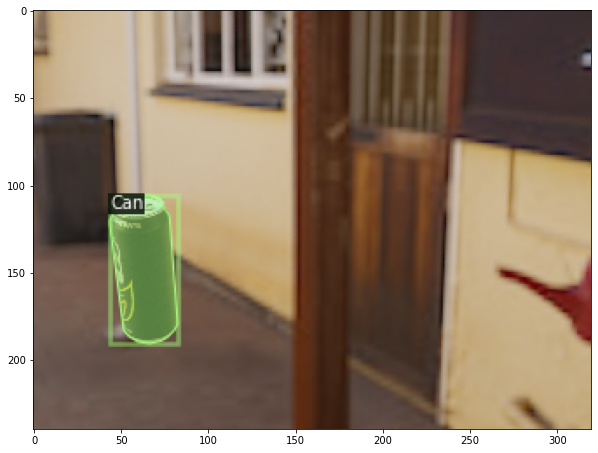

{'file_name': 'output_dataset/train/image.000039.rgb.png', 'height': 480, 'width': 640, 'image_id': 78, 'annotations': [{'iscrowd': False, 'bbox': [158.01, 172.01, 136.98000000000002, 277.98], 'category_id': 1, 'segmentation': [[239.0, 449.99, 220.0, 448.99, 213.01, 443.0, 208.01, 434.0, 207.01, 426.0, 204.01, 420.0, 203.01, 412.0, 199.01, 401.0, 196.01, 383.0, 193.01, 376.0, 193.01, 369.0, 188.01, 359.0, 188.01, 354.0, 183.01, 341.0, 183.01, 334.0, 181.01, 332.0, 161.01, 255.0, 158.01, 248.0, 161.01, 240.0, 182.01, 204.0, 174.01, 180.0, 180.0, 176.01, 195.0, 172.01, 204.0, 172.01, 205.99, 174.0, 209.99, 190.0, 207.99, 192.0, 210.0, 197.01, 239.0, 213.01, 249.99, 222.0, 260.99, 272.0, 269.99, 308.0, 272.99, 315.0, 277.99, 342.0, 294.99, 406.0, 293.99, 422.0, 289.99, 431.0, 285.0, 435.99, 270.0, 442.99, 239.0, 449.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


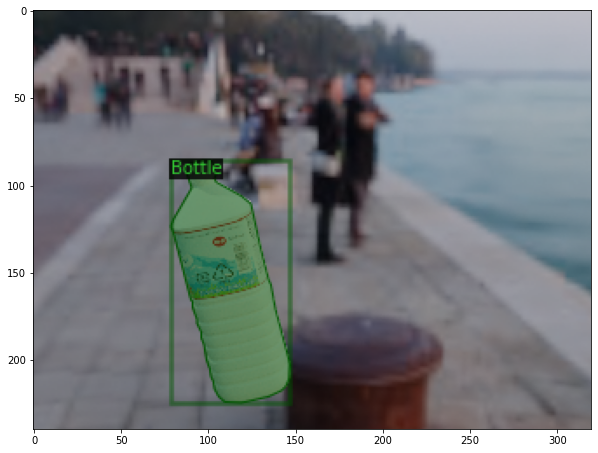

{'file_name': 'output_dataset/train/image.000036.rgb.png', 'height': 480, 'width': 640, 'image_id': 72, 'annotations': [{'iscrowd': False, 'bbox': [84.01, 209.01, 71.98, 168.98000000000002], 'category_id': 0, 'segmentation': [[129.0, 377.99, 110.0, 376.99, 96.0, 365.99, 93.01, 360.0, 84.01, 235.0, 89.01, 225.0, 88.01, 220.0, 94.0, 214.01, 113.0, 209.01, 132.0, 210.01, 142.0, 214.01, 144.99, 217.0, 144.99, 223.0, 149.99, 231.0, 150.99, 237.0, 155.99, 356.0, 152.99, 363.0, 143.0, 372.99, 129.0, 377.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


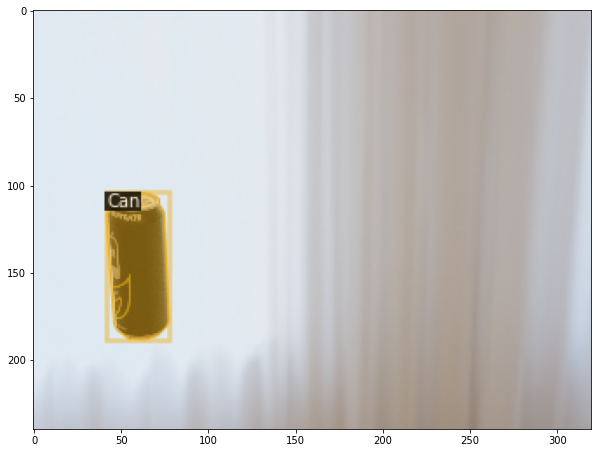

{'file_name': 'output_dataset/train/image.000075.rgb.png', 'height': 480, 'width': 640, 'image_id': 150, 'annotations': [{'iscrowd': False, 'bbox': [437.01, 200.01, 56.98000000000002, 174.98000000000002], 'category_id': 1, 'segmentation': [[472.0, 374.99, 454.0, 372.99, 450.0, 370.99, 443.01, 362.0, 443.01, 344.0, 441.01, 332.0, 442.01, 325.0, 440.01, 312.0, 441.01, 290.0, 438.01, 278.0, 439.01, 273.0, 437.01, 260.0, 437.01, 243.0, 441.01, 231.0, 453.01, 216.0, 452.01, 204.0, 457.0, 200.01, 469.0, 200.01, 470.99, 202.0, 472.99, 214.0, 471.99, 215.0, 482.99, 227.0, 489.99, 240.0, 490.99, 248.0, 491.99, 285.0, 489.99, 289.0, 489.99, 296.0, 492.99, 303.0, 491.99, 324.0, 493.99, 339.0, 493.99, 361.0, 491.99, 366.0, 485.0, 371.99, 472.0, 374.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


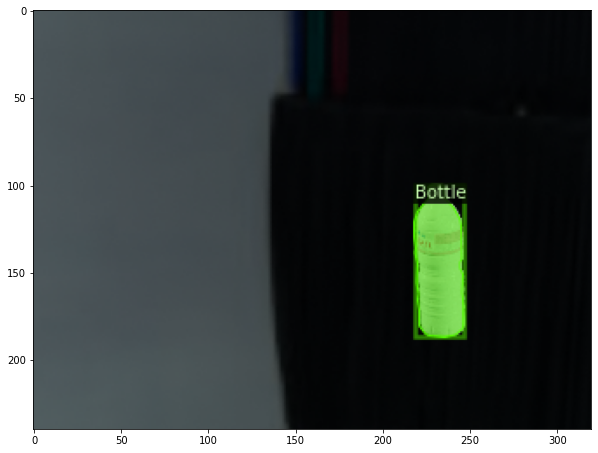

In [ ]:
drinkD.visualize_dataset(drinkD.dataset_dicts_train)

In [ ]:
#Train model
# Remember to select Runtime --> Change Runtime type --> GPU in colab
#drinkD.resume_training = True
drinkD.train(training_steps=500)

[11/30 17:50:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:06, 25.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[11/30 17:50:25 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/30 17:50:54 d2.utils.events]:  eta: 0:11:12  iter: 19  total_loss: 1.89  loss_cls: 1.061  loss_box_reg: 0.1224  loss_mask: 0.683  loss_rpn_cls: 0.001291  loss_rpn_loc: 0.001303  time: 1.3988  data_time: 0.0204  lr: 1.9481e-05  max_mem: 2341M
[11/30 17:51:21 d2.utils.events]:  eta: 0:10:39  iter: 39  total_loss: 1.364  loss_cls: 0.6116  loss_box_reg: 0.1226  loss_mask: 0.6255  loss_rpn_cls: 0.001638  loss_rpn_loc: 0.001507  time: 1.3748  data_time: 0.0100  lr: 3.9461e-05  max_mem: 2341M
[11/30 17:51:48 d2.utils.events]:  eta: 0:10:15  iter: 59  total_loss: 0.8056  loss_cls: 0.1932  loss_box_reg: 0.1153  loss_mask: 0.4976  loss_rpn_cls: 0.0008382  loss_rpn_loc: 0.001135  time: 1.3708  data_time: 0.0099  lr: 5.9441e-05  max_mem: 2341M
[11/30 17:52:15 d2.utils.events]:  eta: 0:09:41  iter: 79  total_loss: 0.6197  loss_cls: 0.1271  loss_box_reg: 0.1255  loss_mask: 0.3764  loss_rpn_cls: 0.001136  loss_rpn_loc: 0.001095  time: 1.3695  data_time: 0.0087  lr: 7.9421e-05  max_mem: 2341M
[11/

In [ ]:
drinkD.predictor_config()

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


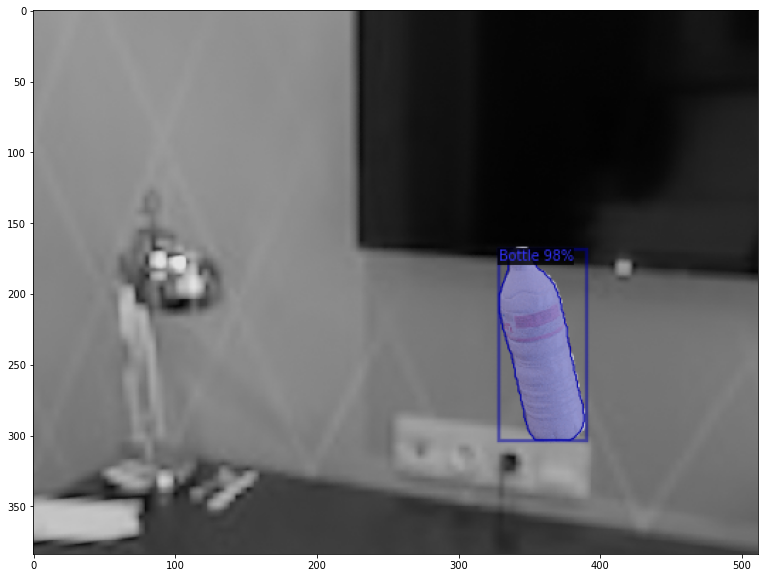

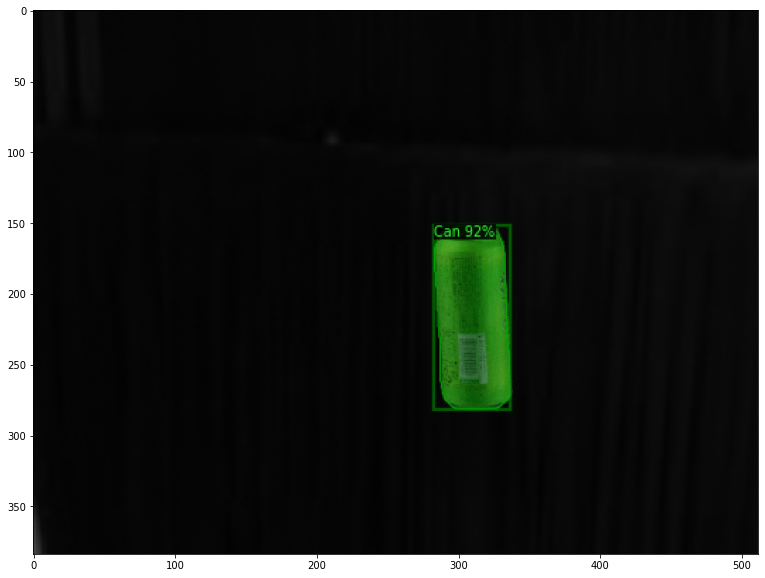

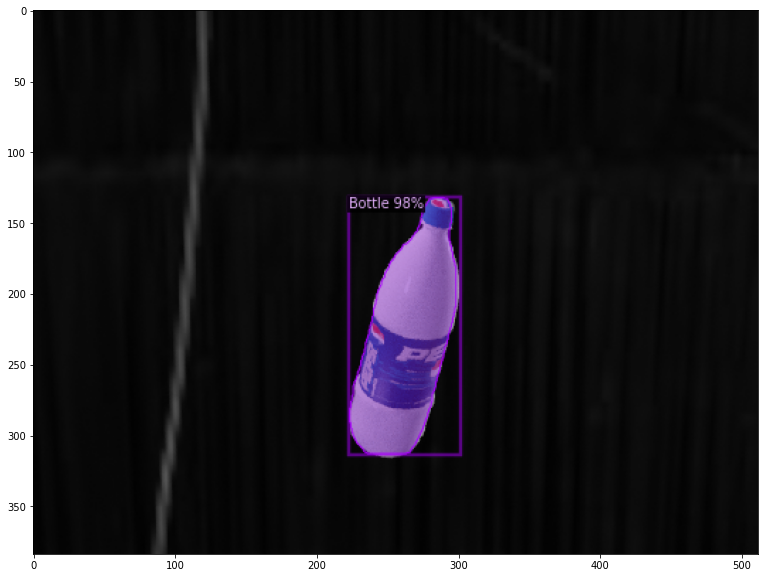

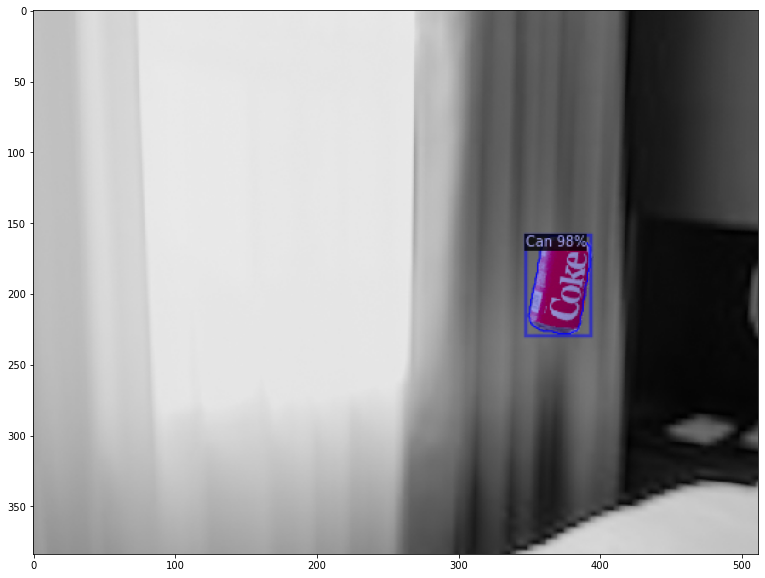

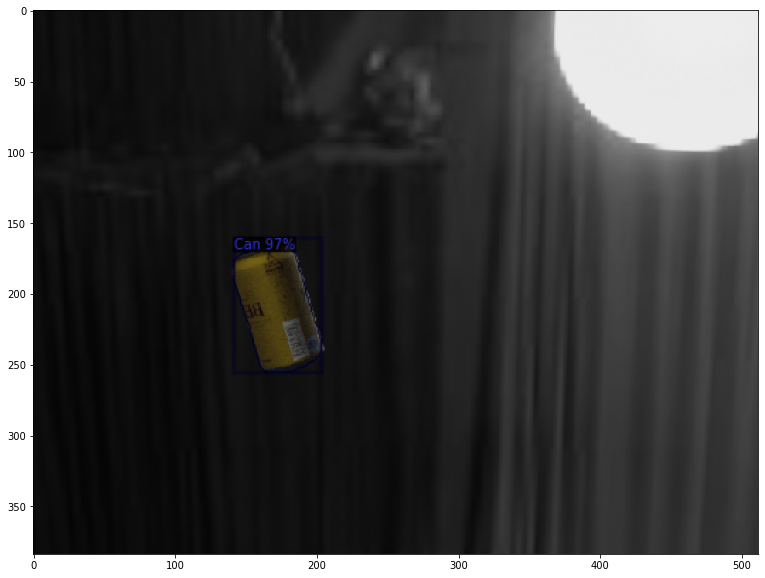

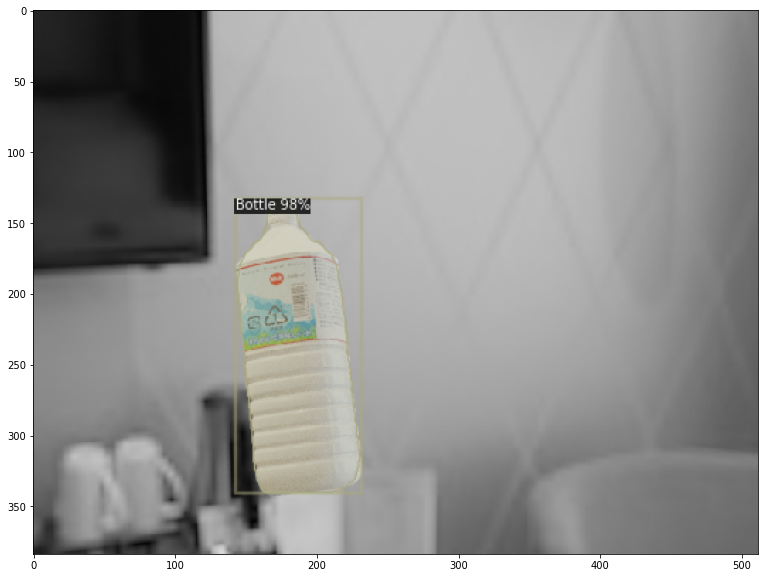

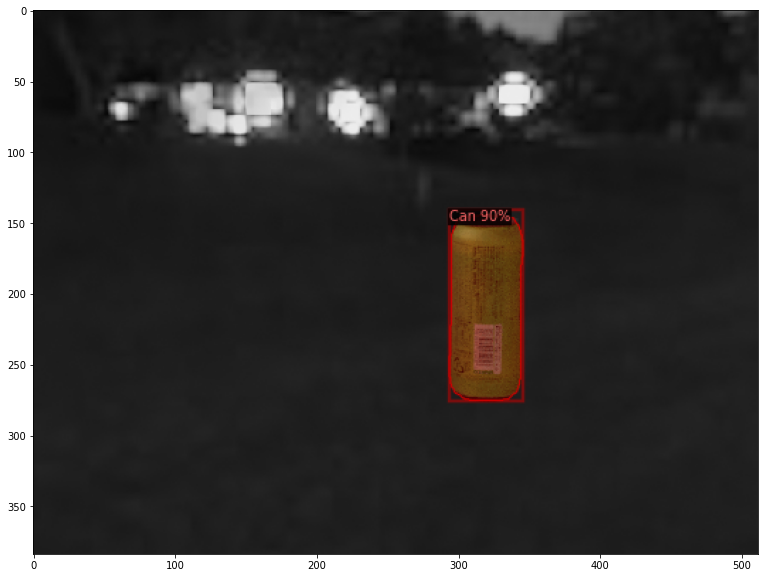

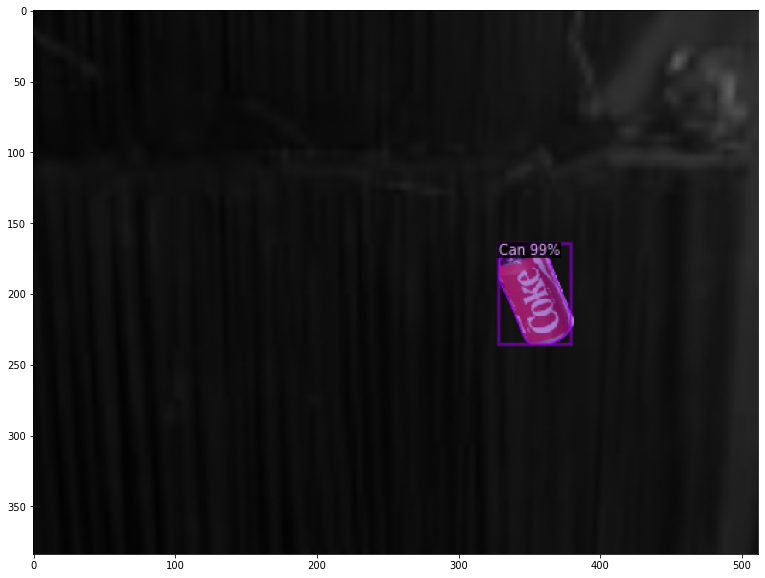

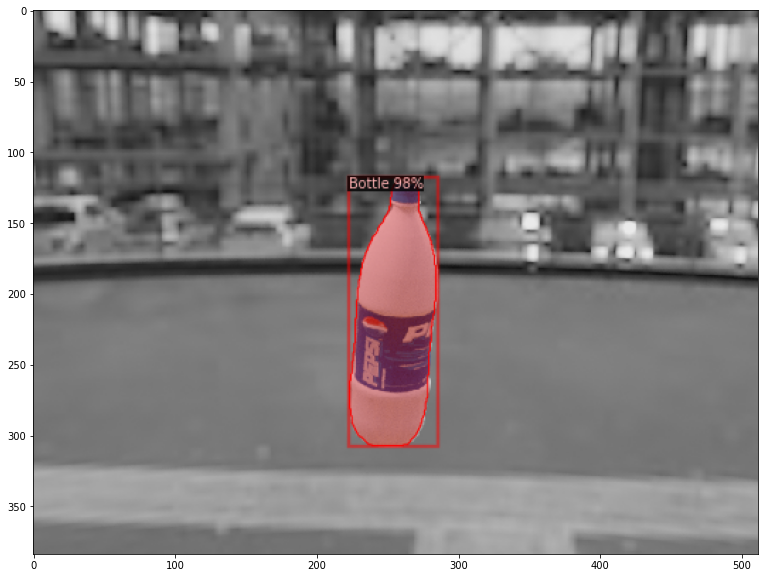

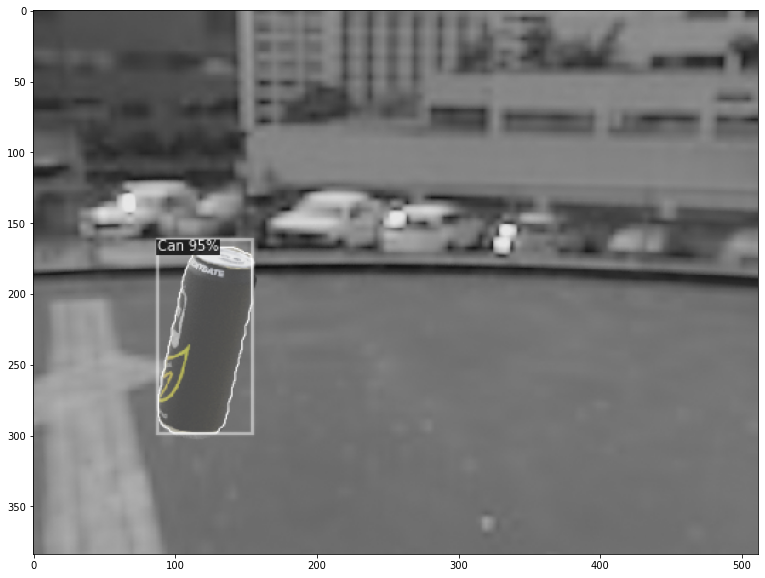

In [ ]:
drinkD.visualize_predictions(n=10, mode="train")

In [ ]:
# Evaluate accuracy on test (aka validation) set
drinkD.evaluate()

WARNING [11/30 18:02:17 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/30 18:02:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/30 18:02:17 d2.data.datasets.coco]: Loaded 10 images in COCO format from output_dataset/test/_annotations.coco.json
[11/30 18:02:17 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    Can     | 7            |   Bottle   | 3            |
|            |              |            |              |
|   total    | 10           |            |              |
[11/30 18:02:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/30 18:02:17 d2.da

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[11/30 18:02:21 d2.evaluation.evaluator]: Total inference time: 0:00:01.826292 (0.365258 s / iter per device, on 1 devices)
[11/30 18:02:21 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.351501 s / iter per device, on 1 devices)
[11/30 18:02:21 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/30 18:02:21 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[11/30 18:02:21 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[11/30 18:02:21 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[11/30 18:02:21 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[11/30 18:02:21 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[11/30 18:02:21 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP)

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


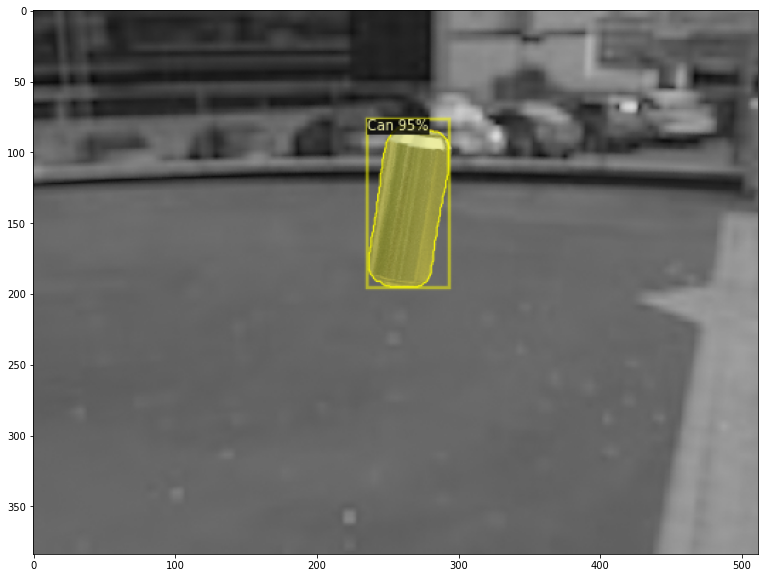

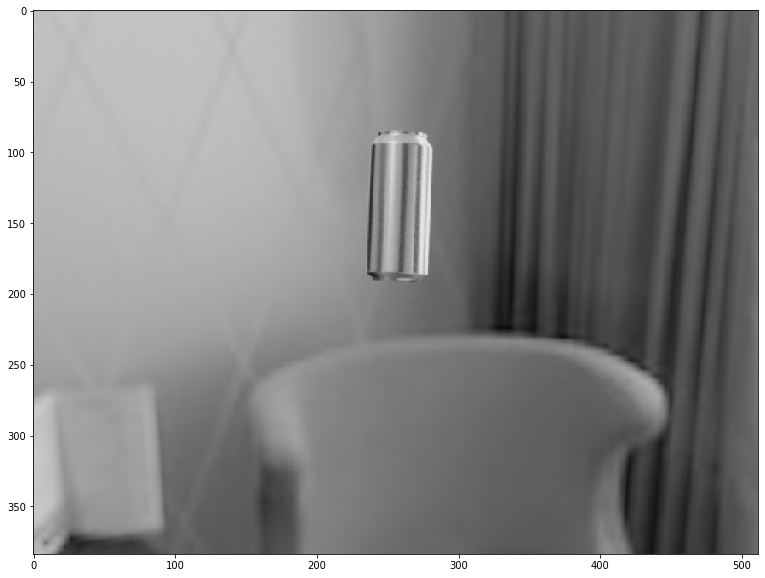

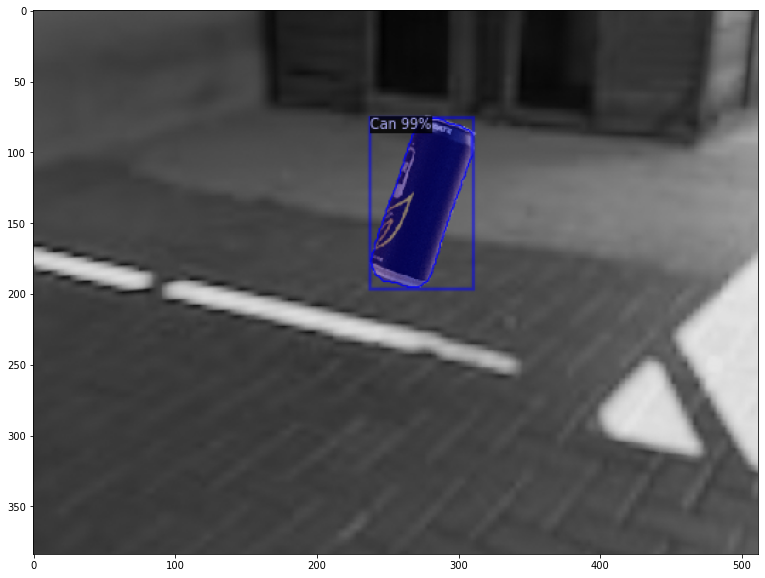

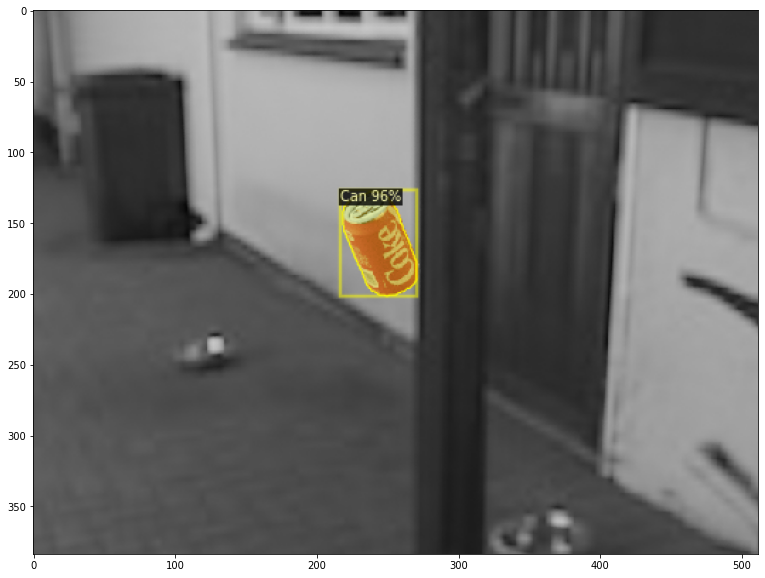

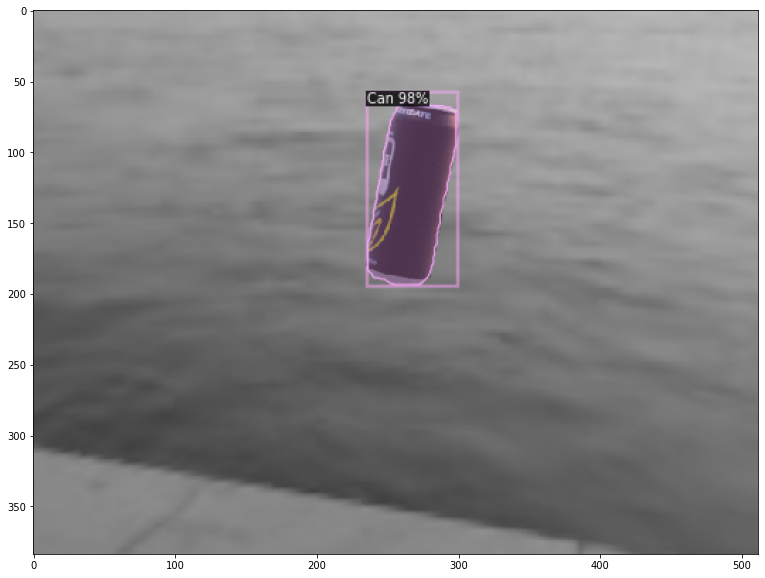

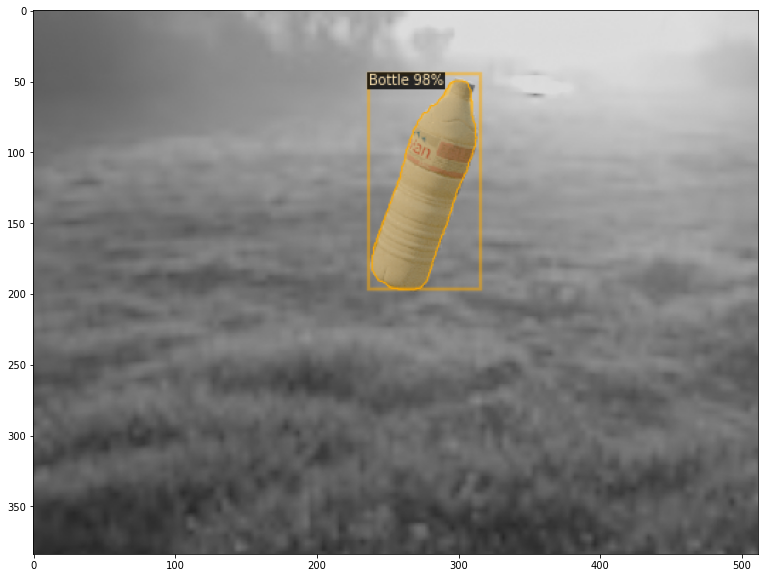

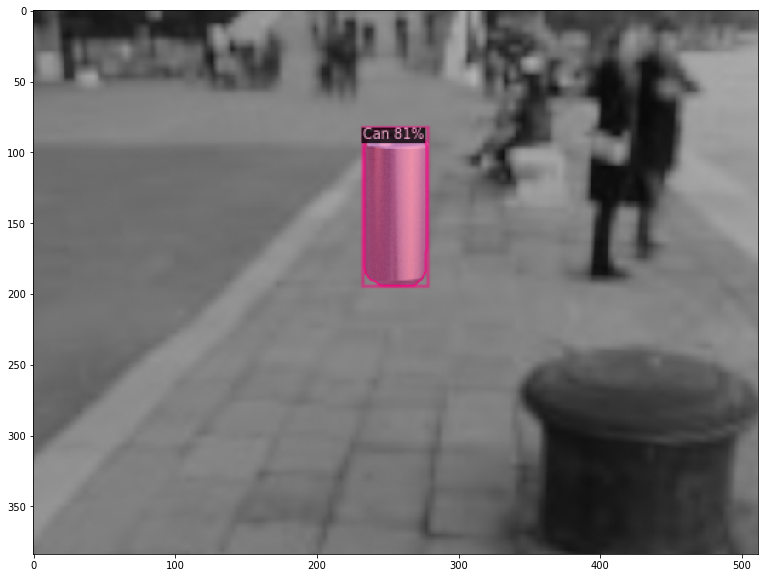

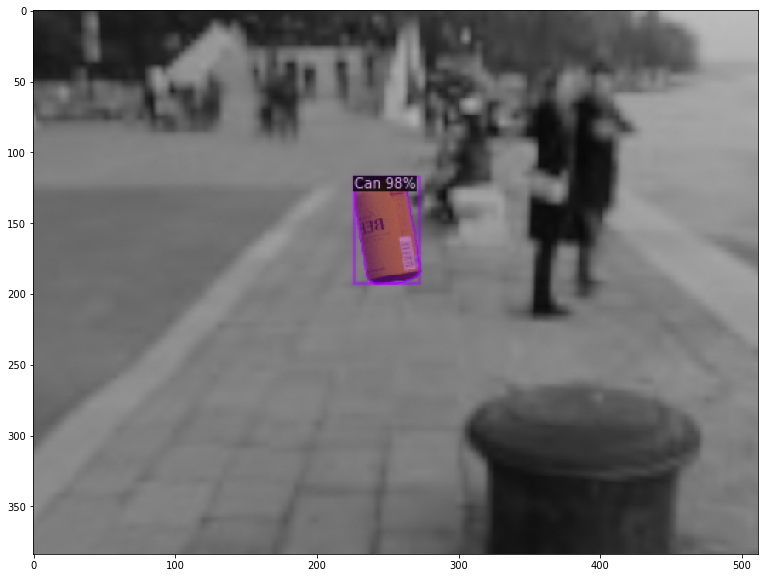

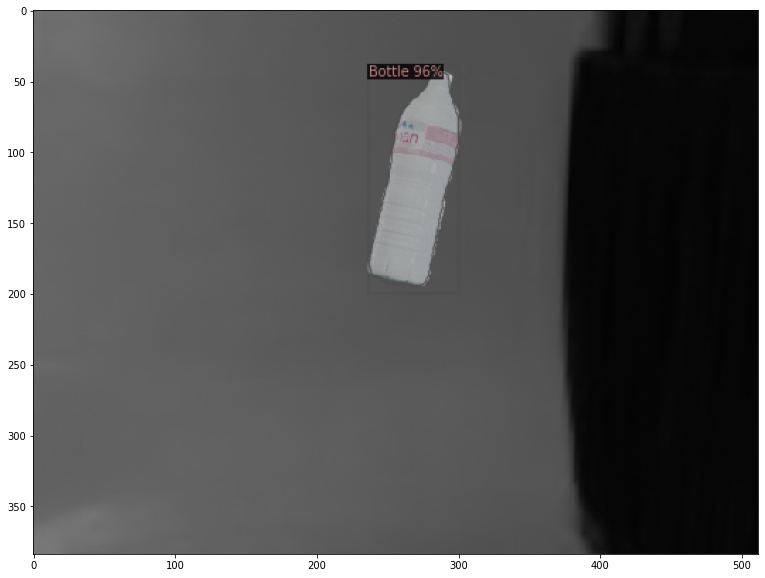

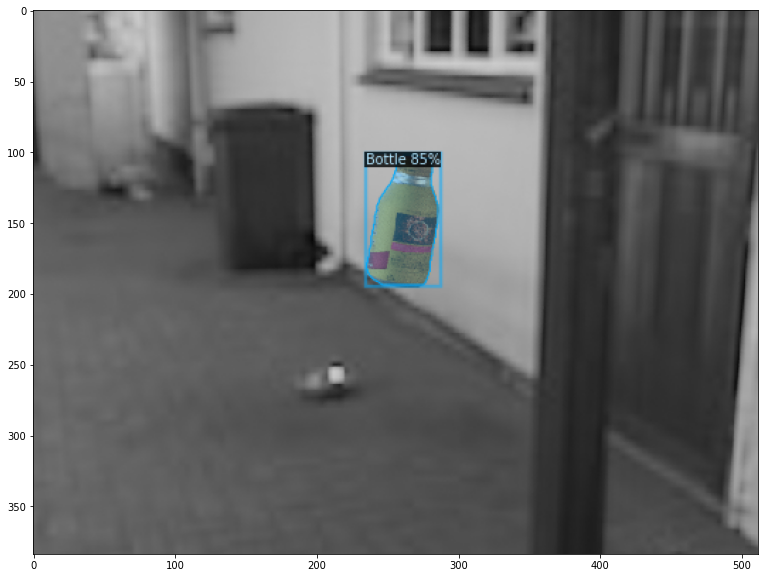

In [ ]:
drinkD.visualize_predictions(n=10, mode="test")

In [ ]:
# Show predictions on unseen (test) images
drinkD.save_predictions(test_path="./target_images/")

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
tensorboard_path = "./output"
#!kill -9 341
%tensorboard --logdir $tensorboard_path

Reusing TensorBoard on port 6006 (pid 590), started 1:38:17 ago. (Use '!kill 590' to kill it.)

<IPython.core.display.Javascript object>